In [1]:
using FredData, DataFrames, Plots, Statistics, Distributions

<br>

### Extract variance from Fred data

In [2]:
fred_data = Fred();

API key loaded.


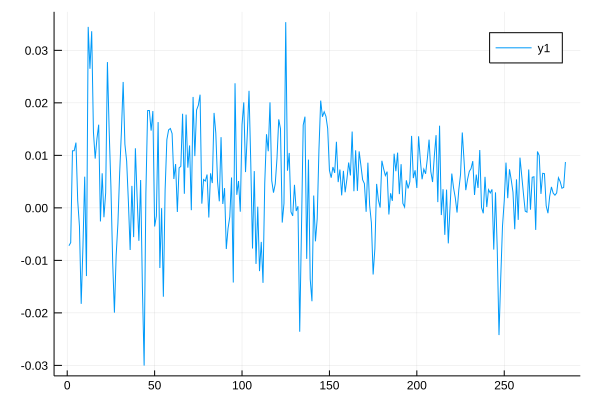

In [76]:
yₕ = get_data(fred_data, "A939RX0Q048SBEA").data.value       # historical GDPpc from Fred
data_l = log.(yₕ)
t = length(yₕ); fod = Array{Float64, 1}(2:t)              # t = number of quarters
fod = data_l[2:end] - data_l[1:end-1]                       # vector with first order differences
sₕ = std(fod, corrected=false)                               # sd of first order differences
plot(1:t-1, fod)

In [133]:
αₕ = mean(-get_data(fred_data, "LABSHPUSA156NRUG").data.value.+1)
Kₕ = get_data(fred_data, "RKNANPUSA666NRUG").data.value;
L_temp = get_data(fred_data, "CLF16OV").data;
Lₕ = []
cache = []
counter = 1
for i in 1:length(L_temp.date)
    if string(L_temp.date[i])[1:4] ∉ cache
        push!(Lₕ,L_temp.value[i])
        counter += 1 
        push!(cache ,string(L_temp.date[i])[1:4])
    end
end
kₕ = Kₕ./Lₕ[end-length(kₕ)+1:end];
nₕ = mean(log.(get_data(fred_data, "CLF16OV").data.value[2:end])-log.(get_data(fred_data, "CLF16OV").data.value[1:end-1]))
σₕ = mean(get_data(fred_data, "PSAVERT").data.value)
tₕ = t
γₕ = prod(get_data(fred_data, "RTFPNAUSA632NRUG").data.value[2:end]./get_data(fred_data, "RTFPNAUSA632NRUG").data.value[1:end-1])^(1/(length(get_data(fred_data, "RTFPNAUSA632NRUG").data.value)-1))^4-1;

<br>

### Theoretical Model

In [178]:
function solow_swan(
        t, # number of periods
        n, # population growth rate
        σ, # savings rate
        δ, # depreciation rate
        α, # share of capital
        k, # initial capital stock
        s, # standard deviation of the random process
        z, # technology constant
        γ  # technology growth
    )
        
    ## setup
    ε = rand(Normal(0,s), t-1)
    A = z.*ℯ.^(ε).*cumprod(ones(t-1).*(1+γ))
    
    
    ## exact solution
    kₑ = [k; zeros(t-1)]
    for tᵢ in 2:t kₑ[tᵢ] = (((1-δ)*kₑ[tᵢ-1])+(σ*A[tᵢ-1]*kₑ[tᵢ-1]^α))/((1+n)*(1+γ)) end
    # outputs
    yₑ = [1; A].*kₑ.^α
    γₑ = log.(kₑ[2:end])-log.(kₑ[1:end-1])
    λₑ = log.(([1; A].*kₑ.^α)[2:end])-log.(([1; A].*kₑ.^α)[1:end-1])
    
    ## approximate solution
    #k_ss = σ^(1/(1-α))/(δ+n)
    #y_ss = (σ/(δ+n)^α)^(1/(1-α))
    #kₐ_tilda = [log(k)-log(k_ss); zeros(t-1)]
    #B = (1+α*n-δ*(1-α))/(1+n)
    #C = (δ+n)/(1+n)
    #for tᵢ in 2:t kₐ_tilda[tᵢ] = B*kₐ_tilda[tᵢ-1]+C*A[tᵢ-1] end
    # outputs
    #kₐ = ℯ.^(kₐ_tilda.+log(k_ss))
    #yₐ = [1; A].*kₐ.^α
    #γₐ = log.(kₐ[2:end])-log.(kₐ[1:end-1])
    #λₐ = log.(([1; A].*kₐ.^α)[2:end])-log.(([1; A].*kₐ.^α)[1:end-1])
    
    ## approximate solution
    k_ss = ((σ*z)/(n+δ + (1+n)*γ))^(1/(1-α))
    kₐ = [k; zeros(t-1)]
    for tᵢ in 2:t kₐ[tᵢ] = k_ss + (1/((1+n)*1+γ))*((kₐ[tᵢ-1]-k_ss)*(α*(n+δ+γ)+(1-δ))+k_ss*(A[tᵢ-1]-1)*(n+δ+γ)) end
    # outputs
    yₐ = [1; A].*kₐ.^α
    γₐ = log.(kₐ[2:end])-log.(kₐ[1:end-1])
    λₐ = log.(([1; A].*kₐ.^α)[2:end])-log.(([1; A].*kₐ.^α)[1:end-1])
        
    return(
        [kₑ, γₑ, yₑ, λₑ], 
        [kₐ, γₐ, yₐ, λₐ], 
        A
    )
end

solow_swan (generic function with 1 method)

In [195]:
# theoretical, approximation, A = solow_swan(t, 0.02, 0.20, 0.10, 0.36, 1.0, 1.0, 1.0);
theoretical, approximation, A = solow_swan(t, nₕ, σₕ, 0.015, αₕ, kₕ[1], sₕ, 1.0, γₕ);
kₑ, γₑ, yₑ, λₑ = theoretical
kₐ, γₐ, yₐ, λₐ = approximation;

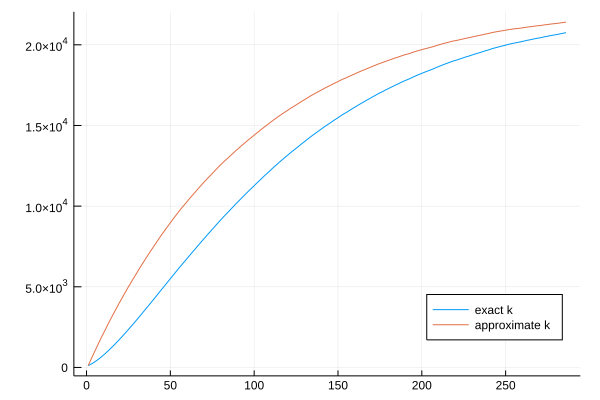

In [196]:
plot(1:t, [kₑ, kₐ], label = ["exact k", "approximate k", ""], legend=:bottomright)

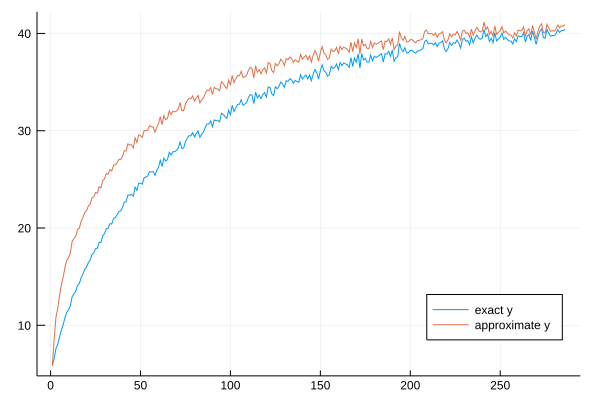

In [197]:
plot(1:t, [yₑ yₐ], label = ["exact y", "approximate y"], legend=:bottomright)

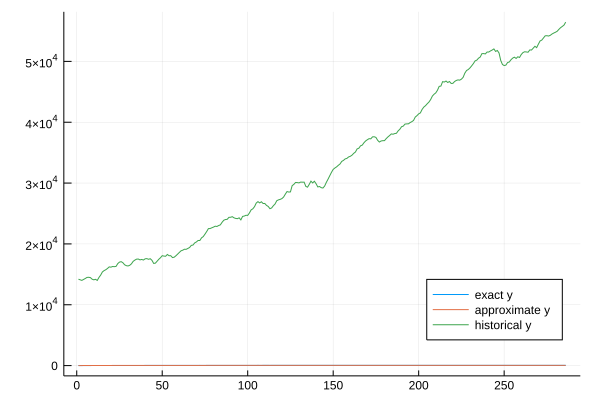

In [198]:
plot(1:t, [yₑ yₐ yₕ], label = ["exact y", "approximate y", "historical y"], legend=:bottomright)

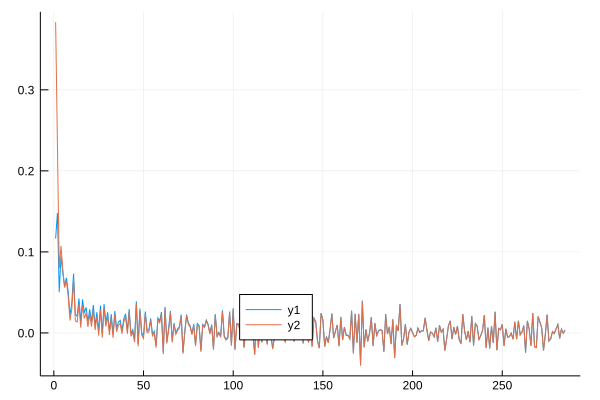

In [199]:
plot(1:t-1, [λₑ, λₐ], legend=:bottom)

<br>